# Homework 2: Augmented Reality with Planar Homographies

#### **For each question please refer to the handout for more details.**

Programming questions begin at **Q2**. **Remember to run all cells** and save the notebook to your local machine as a pdf for gradescope submission.

# Collaborators
**List your collaborators for all questions here**:


---

# Q1 Preliminaries

## Q1.1 The Direct Linear Transform


### Q1.1.1 (3 points)

How many degrees of freedom does **h** have?

---

Homography 'h' has 8 degrees of freedom despite having 9 elements. This is because the equivalence of homogenous coordinates is only defined up to a scale factor.

---

### Q1.1.2 (2 points)

How many point pairs are required to solve **h**?

---

To get the 8 equations that are needed to solve for 8DOFs, a minimum of 4 points are required with each point correspondence giving 2 equations.

---

### Q1.1.3 (5 points)

Derive $\textbf{A}_i$

---

The homography transformation for a point pair is given by:
$$ \\
\begin{pmatrix}
  x_1 \\
  y_1 \\
  1
\end{pmatrix} \equiv
\left(\begin{array}{cc}
h_{11} & h_{12} & h_{13} \\
  h_{21} & h_{22} & h_{23} \\
  h_{31} & h_{32} & h_{33}
\end{array}\right)
\left(\begin{array}{cc}
  x_2 \\
  y_2 \\
  1
\end{array}\right)\\
$$
From this, u and v can be written as,
$$
x_1 = \frac{h_{11}x_2 + h_{12}y_2 + h_{13}}{h_{31}x_2 + h_{32}y_2 + h_{33}} \\
y_1 = \frac{h_{21}x_2 + h_{22}y_2 + h_{23}}{h_{31}x_2 + h_{32}y_2 + h_{33}} \\
$$

Making this linear,
$$
h_{11}x_2 + h_{12}y_2 + h_{13} - (h_{31}x_2 + h_{32}y_2 + h_{33})x_1 = 0 \\
h_{21}x_2 + h_{22}y_2 + h_{23} - (h_{31}x_2 + h_{32}y_2 + h_{33})y_1 = 0 \\
$$
Converting _H_ to a column vector _h_, this equation can be written as,
$$
\left(\begin{array} {cc}
  x_2^i & y_2^i & 1 & 0 & 0 & 0 & -x_1^i⋅x_2^i & -x_1^i⋅y_2^i & -x_1^i \\
  0 & 0 & 0 & x_2^i & y_2^i & 1 & -x_1^i⋅x_2^i & -x_1^i⋅y_2^i & -x_1^i \\
\end{array}\right)
\left(\begin{array} {cc}
  h_{11} \\
  h_{12} \\
  h_{13} \\
  h_{21} \\
  h_{22} \\
  h_{23} \\
  h_{31} \\
  h_{32} \\
  h_{33} \\
\end{array}\right) = 0 \\
$$
which is of the form:
$$
A_i h = 0
$$
where , $i$ $\epsilon$ $\{1...N\}$

---

### Q1.1.4 (5 points)

What will be the trivial solution for **h**? Is the matrix **A** full rank? Why/Why not? What impact will it have on the singular values (i.e. eigenvalues of $\textbf{A}^T\textbf{A}$)?

---

1. The trivial solution of $h$ is the zero vector, where all elements of $h$ are zero. ($h$ = 0)
1. The rank of $A_i$ is less than its number of columns because the system is underdetermined with fewer equations than unknowns (8 degrees of freedom in
$h$).
If we take 4 point pairs to form matrix $A$, the matrix will still not be full rank as there are 9 columns and matrix $A$ can have a maximum rank of 8.
1. Since $A$ has a rank of 8, there will be one singular value that is zero or near-zero, corresponding to the null space dimension. \
The matrix $A^TA$ will be symmetric and positive semi-definite. It will have at least one zero eigenvalue due to the underdetermined nature of the system.


---

## Q1.2 Homography Theory Questions

### Q1.2.1 (5 points)

Prove that there exists a homography **H** that satisfies $\textbf{x}_1 ≡ \textbf{Hx}_2$, given two cameras separated by a pure rotation.

---

For camera 1, the projection of 3D point X on the image plane is given by:
$$
x_1 = K_1 [I|0] X
$$
For camera 2, the prjection of the same 3D point X on the image plane is given by:
$$
x_2 = K_2 [R|0] X
$$
3D point X can be written as,
$$
X = R^{-1} K_2^{-1} x_2
$$
Substituting this into camera 1's projection equation:
$$
x_1 = K_1 [I|0] (R^{-1} K_2^{-1} x_2)
$$
Simplifying,
$$
x_1 = K_1 R^{-1} K_2^{-1} x_2
$$
This gives us:
$$
H = K_1 R^{-1} K_2^{-1} = K_2 R K_1^{-1}
$$
This derivation shows that under pure rotation, there exists a homography matrix $H$.

---

### Q1.2.2 (5 points):

Show that $\textbf{H}^2$ is the homography corresponding to a rotation of 2$\theta$.

---

To show that $H^2$ is the homography corresponding to a rotation of $2\theta$,

Given that the homography for a rotation by angle $\theta$ is expressed as:
$$
H = K R_\theta K^{-1}
$$
For a rotation of angle $2\theta$, the rotation matrix can be expressed as:
$$
R_{2\theta} = R_\theta R_\theta
$$
Thus, the homography for a rotation of angle $2\theta$ is:
$$
H_{2} = K R_{2\theta} K^{-1}
$$
Substituting the expression for $R_{2\theta}$, we get:
$$
H_{2} = K (R_\theta R_\theta) K^{-1} = (K R_\theta K^{-1})(K R_\theta K^{-1}) = H \cdot H = H^2
$$
Therefore, $H^2$ represents the homography corresponding to a rotation of $2\theta$.

---

# Initialization

Run the following code to import the modules you'll need.

In [ ]:
import os
import numpy as np
import cv2
import skimage.color
import pickle
from matplotlib import pyplot as plt
import scipy
from skimage.util import montage
import time
import random

PATCHWIDTH = 9

def read_pickle(path):
    with open(path, "rb") as f:
        return pickle.load(f)

def write_pickle(path, data):
    with open(path, "wb") as f:
        pickle.dump(data, f)

def briefMatch(desc1,desc2,ratio):

    matches = skimage.feature.match_descriptors(desc1,desc2,
                                                'hamming',
                                                cross_check=True,
                                                max_ratio=ratio)
    return matches

def plotMatches(img1,img2,matches,locs1,locs2):

    fig, ax = plt.subplots(nrows=1, ncols=1)
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    plt.axis('off')
    skimage.feature.plot_matches(ax,img1,img2,locs1,locs2,
                                 matches,matches_color='r',only_matches=True)
    plt.show()
    return

def makeTestPattern(patchWidth, nbits):

    np.random.seed(0)
    compareX = patchWidth*patchWidth * np.random.random((nbits,1))
    compareX = np.floor(compareX).astype(int)
    np.random.seed(1)
    compareY = patchWidth*patchWidth * np.random.random((nbits,1))
    compareY = np.floor(compareY).astype(int)

    return (compareX, compareY)

def computePixel(img, idx1, idx2, width, center):

    halfWidth = width // 2
    col1 = idx1 % width - halfWidth
    row1 = idx1 // width - halfWidth
    col2 = idx2 % width - halfWidth
    row2 = idx2 // width - halfWidth
    return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0

def computeBrief(img, locs):

    patchWidth = 9
    nbits = 256
    compareX, compareY = makeTestPattern(patchWidth,nbits)
    m, n = img.shape

    halfWidth = patchWidth//2

    locs = np.array(list(filter(lambda x: halfWidth <= x[0] < m-halfWidth and
                                halfWidth <= x[1] < n-halfWidth, locs)))
    desc = np.array([list(map(lambda x: computePixel(img, x[0], x[1],
                    patchWidth, c), zip(compareX, compareY))) for c in locs])

    return desc, locs

def corner_detection(img, sigma):

    # fast method
    result_img = skimage.feature.corner_fast(img, n=PATCHWIDTH, threshold=sigma)
    locs = skimage.feature.corner_peaks(result_img, min_distance=1)
    return locs

def loadVid(path):

    # Create a VideoCapture object and read from input file
    # If the input is the camera, pass 0 instead of the video file name

    cap = cv2.VideoCapture(path)

    # get fps, width, and height
    fps = cap.get(cv2.CAP_PROP_FPS)
    width  = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
    height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)

    # Append frames to list
    frames = []

    # Check if camera opened successfully
    if cap.isOpened()== False:
        print("Error opening video stream or file")

    # Read until video is completed
    while(cap.isOpened()):

        # Capture frame-by-frame
        ret, frame = cap.read()

        if ret:
            #Store the resulting frame
            frames.append(frame)
        else:
            break

    # When everything done, release the video capture object
    cap.release()
    frames = np.stack(frames)

    return frames, fps, width, height

# Download data

Download the required data and setup the results directory. If running on colab, DATA_PARENT_DIR must be <br> DATA_PARENT_DIR = '/content/' <br> <br> Otherwise, use the local directory of your choosing. Data will be downloaded to DATA_PARENT_DIR/hw3_data and a subdirectory DATA_PARENT_DIR/results will be created.

In [ ]:
# Only change this if you are running locally
# Default on colab: DATA_PARENT_DIR = '/content/'

# Data will be downloaded to DATA_PARENT_DIR/hw3_data
# A subdirectory DATA_PARENT_DIR/results will be created

DATA_PARENT_DIR = '/content/'

if not os.path.exists(DATA_PARENT_DIR):
  raise RuntimeError('DATA_PARENT_DIR does not exist: ', DATA_PARENT_DIR)

RES_DIR = os.path.join(DATA_PARENT_DIR, 'results')
if not os.path.exists(RES_DIR):
  os.mkdir(RES_DIR)
  print('made directory: ', RES_DIR)


#paths different files are saved to
# OPTIONAL:
# feel free to change if funning locally
ROT_MATCHES_PATH = os.path.join(RES_DIR, 'brief_rot_test.pkl')
ROT_INV_MATCHES_PATH = os.path.join(RES_DIR, 'ec_brief_rot_inv_test.pkl')
AR_VID_FRAMES_PATH = os.path.join(RES_DIR, 'q_3_1_frames.npy')
AR_VID_FRAMES_EC_PATH = os.path.join(RES_DIR, 'q_3_2_frames.npy')

HW3_SUBDIR = 'hw3_data'
DATA_DIR = os.path.join(DATA_PARENT_DIR, HW3_SUBDIR)
ZIP_PATH = DATA_DIR + '.zip'
if not os.path.exists(DATA_DIR):
  !wget 'https://www.andrew.cmu.edu/user/hfreeman/data/16720_spring/hw3_data.zip' -O $ZIP_PATH
  !unzip -qq $ZIP_PATH -d $DATA_PARENT_DIR

made directory:  /content/results
--2024-10-07 20:22:03--  https://www.andrew.cmu.edu/user/hfreeman/data/16720_spring/hw3_data.zip
Resolving www.andrew.cmu.edu (www.andrew.cmu.edu)... 128.2.42.53
Connecting to www.andrew.cmu.edu (www.andrew.cmu.edu)|128.2.42.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 36434294 (35M) [application/zip]
Saving to: ‘/content/hw3_data.zip’

/content/hw3_data.z 100%[===================>]  34.75M   704KB/s    in 52s     

2024-10-07 20:22:56 (685 KB/s) - ‘/content/hw3_data.zip’ saved [36434294/36434294]



# Q2 Computing Planar Homographies

## Q2.1 Feature Detection and Matching

### Q2.1.1 (5 points):

How is the FAST detector different from the Harris corner detector that you've seen in the lectures? Can you comment on its computation performance compared to the Harris corner detector?

---

FAST examines a circle of 16 pixels around a potential corner, looking for contiguous arcs of pixels that are all brighter or darker than the center pixel by a threshold. Harris uses a local auto-correlation function to detect corners based on significant changes in all directions. \
FAST is more sensitive to noise due to relying on raw pixel intensities. Harris is more robust as it uses gradients and a local window.

FAST uses simple intensity comparisons and does not require complex mathematical operations. Harris involves calculating image gradients and eigen values, making it more computationally intensive. Additionally, a high-speed test can be done in the FAST corner detector wherein it only examines 4 corners (2 on the vertical and 2 on the horizontal axes) to eliminate a large number of candidate points, making it even more computationally efficient.

---

### Q2.1.2 (5 points):

How is the BRIEF descriptor different from the filterbanks you've seen in the lectures? Could you use any one of the those filter banks as a descriptor?


---
BRIEF is a feature descriptor, designed to differentiate and localise features and interest points in an image by sampling and comparing pixel intensity values.
A filter bank uses mathematical operations to alter the appearance of an image by changing the size, color, intensity etc. The filter bank will allow certain features to be highlighted, which can be extracted by the user.

BRIEF differs from other descriptors because:
1. BRIEF is a binary descriptor, which represents features as a string of     binary values rather than the usual floating point vector representation.  
1. BRIEF uses simple intensity difference tests to generate the descriptor, making it faster and more computationally effective than other descriptors using complex formulas with derivatives.
1. BRIEF however is not inherently rotation or scale invariant as compared to SIFT or SURF which are robust and invariant to rotation or scale.

Filter banks cannot be directly used as descriptors as they do not have the ability to differentiate between highlighted features. Techniques like SIFT and SURF however, utilise filter banks to act as a feature descriptor by using the filter output to identify interest points such as blobs.



---

### Q2.1.3 (5 points):

Describe how the Hamming distance and Nearest Neighbor can be used to match interest points with BRIEF descriptors. What benefits does the Hamming distance have over a more conventional Euclidean distance measure in our setting?

---

To match interest points, the BRIEF descriptor uses Hamming distance to compute differences between two binary strings. The Hamming distance counts the number of positions at which the corresponding points differ. Further, for each binary string of the first image, BRIEF finds the Nearest Neighbour binary string in the second image to create matches.

The benefits of Hamming distance are:
1. Computational efficiency: As Hamming distance only compares binary values, it can be performed quickly using bitwise operations. Euclidean distance requires a much more complex mathematical operation.
1. Memory Efficiency: As BRIEF decriptors are binary strings, using the Euclidean method would be counter intuitive as it will require storing the values in multiple steps. Hamming distance is a natural alternative as it directly compares binary values.

---

### Q2.1.4 (10 points):

#### Implement the function matchPics()

In [ ]:
def matchPics(I1, I2, ratio, sigma):
    """
    Match features across images

    Input
    -----
    I1, I2: Source images (RGB or Grayscale uint8)
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector

    Returns
    -------
    matches: List of indices of matched features across I1, I2 [p x 2]
    locs1, locs2: Pixel coordinates of matches [N x 2]
    """

    # ===== your code here! =====

    # TODO: Convert images to GrayScale
    # Input images can be either RGB or Grayscale uint8 (0 -> 255). Both need
    # to be supported.
    # Input images must be converted to normalized Grayscale (0.0 -> 1.0)
    # skimage.color.rgb2gray may be useful if the input is RGB.
    I1 = np.array(I1).astype(np.float32)
    if len(I1.shape) == 3 and I1.shape[2] == 3:
      I1 = skimage.color.rgb2gray(I1)

    I2 = np.array(I2).astype(np.float32)
    if len(I2.shape) == 3 and I2.shape[2] == 3:
      I2 = skimage.color.rgb2gray(I2)

    I1 = I1 / 255
    I2 = I2 / 255

    # TODO: Detect features in both images
    corners1 = corner_detection(I1, sigma)
    corners2 = corner_detection(I2, sigma)
    # TODO: Obtain descriptors for the computed feature locations
    desc1, locs1 = computeBrief(I1, corners1)
    desc2, locs2 = computeBrief(I2, corners2)
    # TODO: Match features using the descriptors
    matches = briefMatch(desc1, desc2, ratio)

    # ==== end of code ====

    return matches, locs1, locs2

#### Implement the function displayMatched

In [ ]:
def displayMatched(I1, I2, ratio, sigma):
    """
    Displays matches between two images

    Input
    -----
    I1, I2: Source images
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    """

    print('Displaying matches for ratio: ', ratio, ' and sigma: ', sigma)

    # ===== your code here! =====
    # TODO: Use matchPics and plotMatches to visualize your results
    matches, locs1, locs2 = matchPics(I1, I2, ratio, sigma)
    plotMatches(I1,I2, matches, locs1, locs2)
    # ==== end of code ====


#### Visualize the matches

Use the cell below to visualize the matches. The resulting figure should look similar (but not necessarily identical) to Figure 2.

Feel free to play around with the images and parameters. Please use the original images when submitting the report.

Figure 2 parameters:

*   image1_name = "cv_cover.jpg"
*   image1_name = "cv_desk.png"
*   ratio = 0.7
*   sigma = 0.15

Displaying matches for ratio:  0.7  and sigma:  0.15


<ipython-input-3-2390a488d248>:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0
<ipython-input-3-2390a488d248>:36: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  skimage.feature.plot_matches(ax,img1,img2,locs1,locs2,


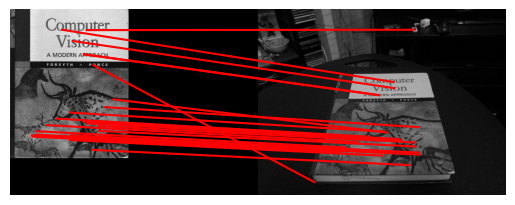

In [ ]:
# Feel free to play around with these parameters
# BUT when submitting the report use the original images
image1_name = "cv_cover.jpg"
image2_name = "cv_desk.png"
ratio = 0.7
sigma = 0.15

image1_path = os.path.join(DATA_DIR, image1_name)
image2_path = os.path.join(DATA_DIR, image2_name)

image1 = cv2.imread(image1_path)
image2 = cv2.imread(image2_path)

#bgr to rgb
if len(image1.shape) == 3 and image1.shape[2] == 3:
  image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

if len(image2.shape) == 3 and image2.shape[2] == 3:
  image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

displayMatched(image1, image2, ratio, sigma)

### Q2.1.5 (10 points):

Experiment with different sigma and ratio values. Conduct a small ablation study, and include the figures displaying the matched features with various parameters in your write-up. Explain the effect of these two paremeters respectively.

---

Explain the effect of these two parameters:

1. Sigma: Sigma is the threshold value for detecting corners. As sigma is increased, the number of corners detected decreases. This is because sigma defines the minimum threshold to pass off points as a corner. As the threshold increases, less points satisfy the required intensity comparison conditions.
1. Ratio: Ratio is the maximum ratio of distances between first and second closest descriptor in the second set of descriptors. As ratio is increased, the number of matches computed increases. This is because more corners will satisfy the condition as the threshold for matching is increased. However, this will also lead to more false matches causing errors in further computation.

---

Displaying matches for ratio:  0.7  and sigma:  0.1


<ipython-input-4-2390a488d248>:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0
<ipython-input-4-2390a488d248>:36: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  skimage.feature.plot_matches(ax,img1,img2,locs1,locs2,


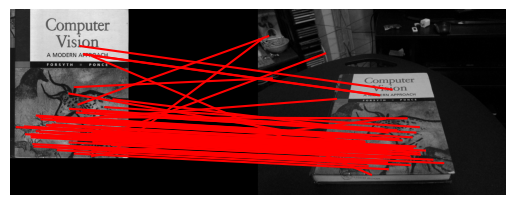

Displaying matches for ratio:  0.7  and sigma:  0.15


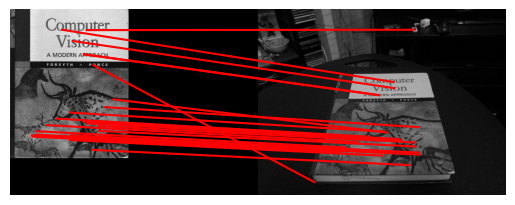

Displaying matches for ratio:  0.7  and sigma:  0.2


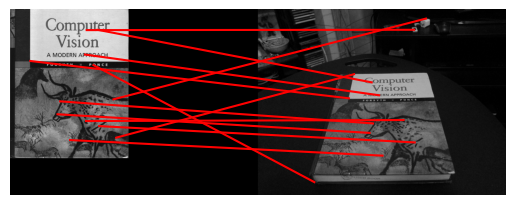

Displaying matches for ratio:  0.7  and sigma:  0.25


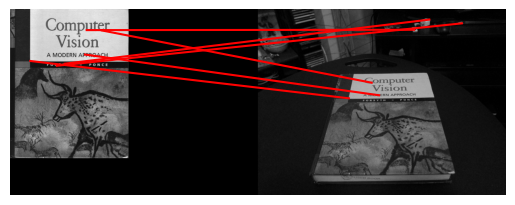

Displaying matches for ratio:  0.5  and sigma:  0.15


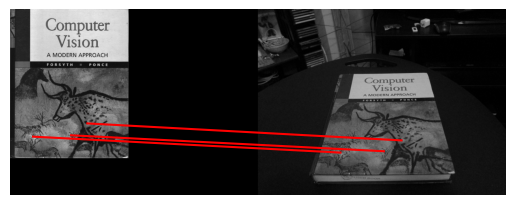

Displaying matches for ratio:  0.6  and sigma:  0.15


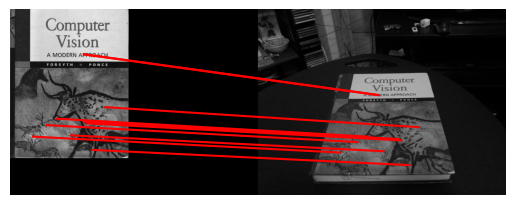

Displaying matches for ratio:  0.7  and sigma:  0.15


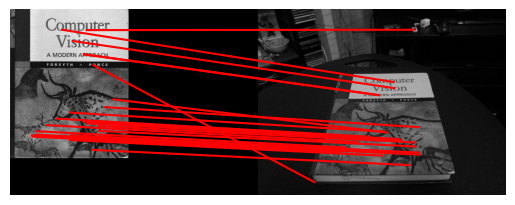

Displaying matches for ratio:  0.8  and sigma:  0.15


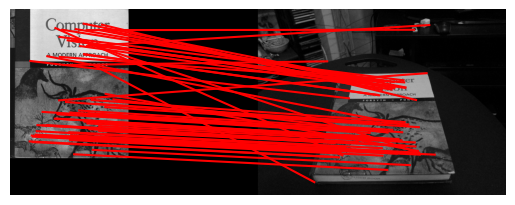

Displaying matches for ratio:  0.9  and sigma:  0.15


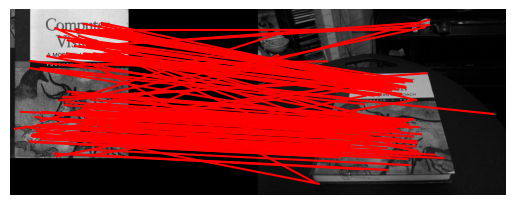

In [ ]:
image1_name = "cv_cover.jpg"
image2_name = "cv_desk.png"

image1_path = os.path.join(DATA_DIR, image1_name)
image2_path = os.path.join(DATA_DIR, image2_name)

image1 = cv2.imread(image1_path)
image2 = cv2.imread(image2_path)

#bgr to rgb
if len(image1.shape) == 3 and image1.shape[2] == 3:
  image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

if len(image2.shape) == 3 and image2.shape[2] == 3:
  image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# ===== your code here! =====
# Experiment with different sigma and ratio values.
# Use displayMatches to visualize.
# Include the matched feature figures in the write-up.

sigmas = [.1, .15, .2, .25]
ratios = [.5, .6, .7, .8, .9]

for sigma in sigmas:
  displayMatched(image1, image2, 0.7, sigma)

for ratio in ratios:
  displayMatched(image1, image2, ratio, 0.15)

# ==== end of code ====

### Q2.1.6 (10 points):

#### Implement the function briefRot

In [ ]:
def briefRot(min_deg, max_deg, deg_inc, ratio, sigma, filename):
    """
    Tests Brief with rotations.

    Input
    -----
    min_deg: minimum degree to rotate image
    max_deg: maximum degree to rotate image
    deg_inc: number of degrees to increment when iterating
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    filename: filename of image to rotate

    """

    if not os.path.exists(RES_DIR):
      raise RuntimeError('RES_DIR does not exist. did you run all cells?')

    # Read the image and convert bgr to rgb
    image_path = os.path.join(DATA_DIR, filename)
    image = cv2.imread(image_path)
    if len(image.shape) == 3 and image.shape[2] == 3:
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    match_degrees = [] # stores the degrees of rotation
    match_counts = [] # stores the number of matches at each degree of rotation

    for i in range(min_deg, max_deg, deg_inc):
        print(i)

        # ===== your code here! =====
        # TODO: Rotate Image (Hint: use scipy.ndimage.rotate)
        rotated_image = scipy.ndimage.rotate(image, i)
        # TODO: Match features in images
        matches, locs1, locs2 = matchPics(image, rotated_image, ratio, sigma)
        # TODO: visualizes matches at at least 3 different orientations
        # to include in your report
        # (Hint: use plotMatches)
        plotMatches(image, rotated_image, matches, locs1, locs2)
        # TODO: Update match_degrees and match_counts (see descriptions above)
        match_degrees.append(i)
        match_counts.append(len(matches))
        # ==== end of code ====

    # Save to pickle file
    matches_to_save = [match_counts, match_degrees, deg_inc]
    write_pickle(ROT_MATCHES_PATH, matches_to_save)

def dispBriefRotHist(matches_path=ROT_MATCHES_PATH):
    # Check if pickle file exists
    if not os.path.exists(matches_path):
      raise RuntimeError('matches_path does not exist. did you call briefRot?')

    # Read from pickle file
    match_counts, match_degrees, deg_inc = read_pickle(matches_path)

    # Display histogram
    # Bins are centered and separated every 10 degrees
    plt.figure()
    bins = [x - deg_inc/2 for x in match_degrees]
    bins.append(bins[-1] + deg_inc)
    plt.hist(match_degrees, bins=bins, weights=match_counts, log=True)
    #plt.hist(match_degrees, bins=[10 * (x-0.5) for x in range(37)], weights=match_counts, log=True)
    plt.title("Histogram of BRIEF matches")
    plt.ylabel("# of matches")
    plt.xlabel("Rotation (deg)")
    plt.tight_layout()

    output_path = os.path.join(RES_DIR, 'histogram.png')
    plt.savefig(output_path)

#### Visualize the matches under rotation

See debugging tips in handout.


0


<ipython-input-4-2390a488d248>:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0
<ipython-input-4-2390a488d248>:36: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  skimage.feature.plot_matches(ax,img1,img2,locs1,locs2,


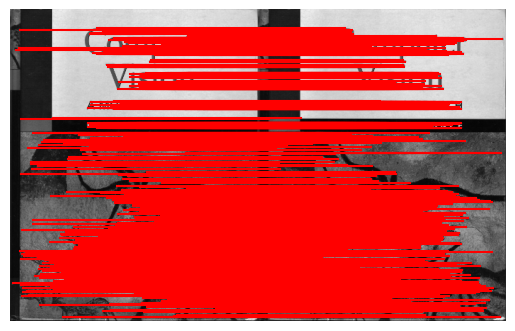

10


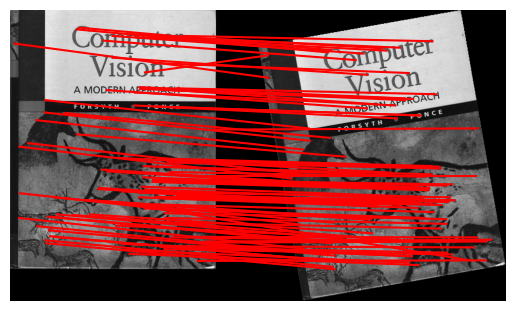

20


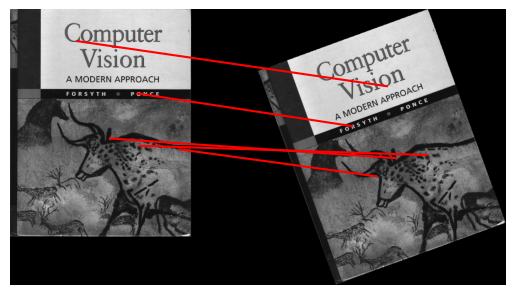

In [ ]:
# defaults are:
# min_deg = 0
# max_deg = 360
# deg_inc = 10
# ratio = 0.7
# sigma = 0.15
# filename = 'cv_cover.jpg'

# Controls the rotation degrees
min_deg = 0
max_deg = 30
deg_inc = 10

# Brief feature descriptor and Fast feature detector paremeters
# (change these if you want to use different values)
ratio = 0.7
sigma = 0.15

# image to rotate and match
# (no need to change this but can if you want to experiment)
filename = 'cv_cover.jpg'

# Call briefRot
briefRot(min_deg, max_deg, deg_inc, ratio, sigma, filename)

#### Plot the histogram

See debugging tips in handout.

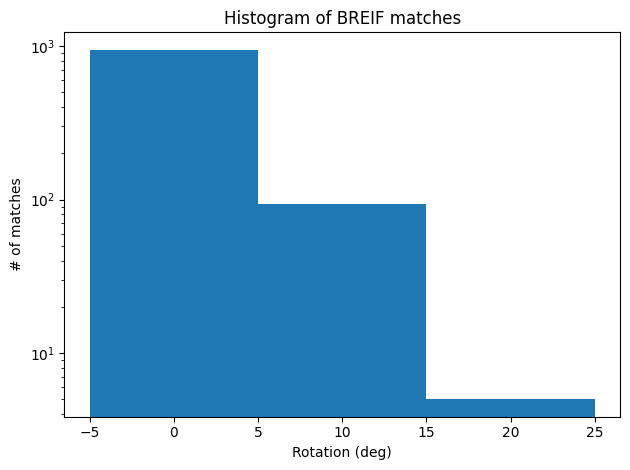

In [ ]:
dispBriefRotHist()

---

Explain why you think the BRIEF descriptor behaves this way:

BRIEF Descriptor inherently is not rotation invariant. This is because it has a fixed sampling pattern of pixel pairs and it does not estimate the orientation of any interest point. Additionally, the intensity comparisons will also differ when the image patch is rotated causing very different descriptors.

---

### Q2.1.7.1 (Extra Credit - 5 points):

Design a fix to make BRIEF more rotation invariant. Feel free to make any helper functions as necessary. But you cannot use any additional OpenCV or Scikit-Image functions.

In [ ]:
# ===== your code here! =====
# TODO: Define any helper functions here
# (Feel free to put anything in its own cell)

# TODO: Feel free to modify the inputs and the function body as necessary
# This is only an outline
def briefRotInvEc(min_deg, max_deg, deg_inc, ratio, sigma, filename):
    """
    Rotation invariant Brief.

    Input
    -----
    min_deg: minimum degree to rotate image
    max_deg: maximum degree to rotate image
    deg_inc: number of degrees to increment when iterating
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    filename: filename of image to rotate

    """

    if not os.path.exists(RES_DIR):
      raise RuntimeError('RES_DIR does not exist. did you run all cells?')

    #Read the image and convert bgr to rgb
    image_path = os.path.join(DATA_DIR, filename)
    image = cv2.imread(image_path)
    if len(image.shape) == 3 and image.shape[2] == 3:
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    match_degrees = [] # stores the degrees of rotation
    match_counts = [] # stores the number of matches at each degree of rotation

    for i in range(min_deg, max_deg, deg_inc):
        print(i)

        # TODO: Rotate Image (Hint: use scipy.ndimage.rotate)

        # TODO: Brief matcher that is rotation invariant
        # Feel free to define additional helper functions as necessary

        # TODO: visualizes matches at at least 3 different orientations
        # to include in your report
        # (Hint: use plotMatches)

        # TODO: Update match_degrees and match_counts (see descriptions above)

    # Save to pickle file
    matches_to_save = [match_counts, match_degrees, deg_inc]
    write_pickle(ROT_INV_MATCHES_PATH, matches_to_save)

# ==== end of code ====

#### Visualize your implemented function


In [ ]:
min_deg = 0
max_deg = 360
deg_inc = 10
filename = 'cv_cover.jpg'

# ===== your code here! =====
# TODO: Call briefRotInvEc and visualize

# ==== end of code ====


#### Plot Histogram

In [ ]:
dispBriefRotHist(matches_path=ROT_INV_MATCHES_PATH)

RuntimeError: matches_path does not exist. did you call briefRot?

---

Compare the histograms with an without rotation invariance. Explain your rotation invariant design and how you selected any parameters that you used: YOUR ANSWER HERE...

---

### Q2.1.7.2 (Extra Credit - 5 points):

Design a fix to make BRIEF more scale invariant. Feel free to make any helper functions as necessary. But you cannot use any additional OpenCV or Scikit-Image functions.


In [ ]:
# ===== your code here! =====
# TODO: Define any helper functions here
# (Feel free to put anything in its own cell)

# TODO: Modify the inputs and the function body as necessary
def briefScaleInvEc(ratio, sigma, filename):

    #Read the image and convert bgr to rgb
    image_path = os.path.join(DATA_DIR, filename)
    image = cv2.imread(image_path)
    if len(image.shape) == 3 and image.shape[2] == 3:
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    match_scales = [] # stores the scaling factors
    match_counts = [] # stores the number of matches at each scaling factor

    for i in [1]:
        # Scale Image
        image_scale = cv2.resize(image,(int(image.shape[1]/(2**i)),
                                        int(image.shape[0]/(2**i))),
                                 interpolation = cv2.INTER_AREA)

        # TODO: Brief matcher that is scale invariant
        # Feel free to define additional helper functions as necessary

        # Compare to regular matchPics
        matches_orig, locs1_orig, locs2_orig = matchPics(image,
                                                         image_scale,
                                                         ratio, sigma)

        print('plotting non-scale invariant scale: ', 2**i)
        plotMatches(image, image_scale, matches_orig, locs1_orig,
                    locs2_orig)
        print('plotting scale-invariant: ', 2**i)
        plotMatches(image, image_scale, matches, locs1, locs2)

# ==== end of code ====

#### Visualize your implemented function

In [ ]:
# ===== your code here! =====
# TODO: Call briefScaleInvEc and visualize
# You may change any parameters and the function body as necessary

filename = 'cv_cover.jpg'

ratio = 0.7
sigma = 0.15

briefScaleInvEc(ratio, sigma, filename)
# ==== end of code ====

---

Explain your scale invariant design and how you selected any parameters that you used: YOUR ANSWER HERE...

---


## Q2.2 Homography Computation

### Q2.2.1 (15 Points):

Implement the function computeH

In [ ]:
def computeH(x1, x2):
    """
    Compute the homography between two sets of points

    Input
    -----
    x1, x2: Sets of points

    Returns
    -------
    H2to1: 3x3 homography matrix that best transforms x2 to x1
    """

    if x1.shape != x2.shape:
        raise RuntimeError('number of points do not match')

    # ===== your code here! =====
    # TODO: Compute the homography between two sets of points
    A = []
    for i in range(len(x1)):
        x1, y1 = x1[i][0], x1[i][1]
        x2, y2 = x2[i][0], x2[i][1]
        A.append([-x*X, -y, -1, 0, 0, 0, X*x, X*y, X])
        A.append([0, 0, 0, -x, -y, -1, Y*x, Y*y, Y])

    A = np.array(A)
    #print('Shape of A = ', A.shape)

    _, S,Vh = np.linalg.svd(A)
    #print('S = ', S)
    S_chosen = np.argmin(S)
    #print('Index chosen = ', S_chosen)
    h = Vh[S_chosen,:]

    H2to1 = np.reshape(h, (3,3))
    H2to1 /= H2to1[2,2]
    #print('H = ', H2to1)
    # ==== end of code ====

    return H2to1

### Q2.2.2 (10 points):

Implement the function computeH_norm

In [ ]:
def computeH_norm(x1, x2):
    """
    Compute the homography between two sets of points using normalization

    Input
    -----
    x1, x2: Sets of points

    Returns
    -------
    H2to1: 3x3 homography matrix that best transforms x2 to x1
    """
    if x1.shape != x2.shape:
        raise RuntimeError('number of points do not match')
    # ===== your code here! =====

    # TODO: Compute the centroid of the points
    centroid_1 = np.mean(x1, axis=0)
    centroid_2 = np.mean(x2, axis=0)
    #print('centroid 1 = ',centroid_1)
    #print('centroid 2 = ',centroid_2)

    # TODO: Shift the origin of the points to the centroid
    T_shift_1 = np.array([[1, 0, -centroid_1[0]],
                        [0, 1, -centroid_1[1]],
                        [0, 0, 1]])
    T_shift_2 = np.array([[1, 0, -centroid_2[0]],
                        [0, 1, -centroid_2[1]],
                        [0, 0, 1]])

    ones = np.ones((x1.shape[0], 1))
    x1_homogeneous = np.hstack((x1, ones))
    x2_homogeneous = np.hstack((x2, ones))

    x1_shifted = T_shift_1 @ x1_homogeneous.T
    x2_shifted = T_shift_2 @ x2_homogeneous.T

    # TODO: Normalize the points so that the largest distance from the origin is equal to sqrt(2)
    d1 = np.max(np.linalg.norm(x1_shifted[:2]))
    d2 = np.max(np.linalg.norm(x2_shifted[:2]))
    T_scale_1 = np.array([[np.sqrt(2) / d1, 0, 0],
                          [0, np.sqrt(2) / d1, 0],
                          [0, 0, 1]])
    T_scale_2 = np.array([[np.sqrt(2) / d2, 0, 0],
                          [0, np.sqrt(2) / d2, 0],
                          [0, 0, 1]])

    # TODO: Similarity transform 1
    # TODO: Similarity transform 2
    T_norm_1 = T_scale_1 @ T_shift_1
    T_norm_2 = T_scale_2 @ T_shift_2

    x1_normalized = (T_norm_1 @ x1_homogeneous.T)
    x2_normalized = (T_norm_2 @ x2_homogeneous.T)

    x1_locs = x1_normalized[:2,:]
    x2_locs = x2_normalized[:2,:]

    # TODO: Compute homography
    H2to1 = computeH(x1_locs.T, x2_locs.T)

    # TODO: Denormalization
    H2to1 = np.linalg.inv(T_norm_1) @ H2to1 @ T_norm_2
    H2to1 /= H2to1[2,2]
    # ==== end of code ====

    return H2to1

### Q2.2.3 (25 points):

Implement RANSAC

In [ ]:
def computeH_ransac(locs1, locs2, max_iters, inlier_tol):
    """
    Estimate the homography between two sets of points using ransac

    Input
    -----
    locs1, locs2: Lists of points
    max_iters: the number of iterations to run RANSAC for
    inlier_tol: the tolerance value for considering a point to be an inlier

    Returns
    -------
    bestH2to1: 3x3 homography matrix that best transforms locs2 to locs1
    inliers: indices of RANSAC inliers

    """

    # ===== your code here! =====

    # TODO:
    # Compute the best fitting homography using RANSAC
    # given a list of matching points locs1 and loc2
    # You should call computeH_norm for this
    if locs1.shape != locs2.shape:
      raise RuntimeError('number of points do not match')

    #print(locs1)
    #print(locs2)

    bestH2to1 = None
    best_inliers = []

    ones = np.ones((locs1.shape[0], 1))
    locs1_homogeneous = np.hstack((locs1, ones))
    locs2_homogeneous = np.hstack((locs2, ones))
    #print(locs1_homogeneous.shape)
    #print(locs2_homogeneous.shape)

    for i in range(max_iters):
      #print('\n','iteration = ', i+1)
      random_indices = random.sample(list(range(len(locs1))), 4)
      random_indices.sort()
      random_locs1 = np.float32([locs1[i,:] for i in random_indices])
      random_locs2 = np.float32([locs2[i,:] for i in random_indices])
      #print("random 1 = ", random_locs1)
      #print("random 2 = ", random_locs2)
      H2to1 = computeH_norm(random_locs1, random_locs2)
      #print("H =",  H2to1)
      num_inliers = 0
      inliers_indices = []
      for j in range(locs2.shape[0]):
        projected_point  = np.array(H2to1 @ locs2_homogeneous[j,:].T)
        projected_point /= projected_point[2]
        #print(projected_point)
        error = np.array(projected_point - locs1_homogeneous[j,:].T)
        #print(error)
        distance = (error[0]**2 + error[1]**2) ** 0.5
        #print('distance =', distance)
        if distance < inlier_tol:
          num_inliers += 1
          #print(num_inliers)
          inliers_indices.append(j)

      if bestH2to1 is None or num_inliers > best_inliers_num:
        bestH2to1 = H2to1
        best_inliers_indices = inliers_indices
        best_inliers_num = num_inliers

    best_inliers_locs2 = np.float32([locs2[i,:] for i in best_inliers_indices])
    best_inliers_locs1 = np.float32([locs1[i,:] for i in best_inliers_indices])
    bestH2to1 = computeH_norm(best_inliers_locs1, best_inliers_locs2)

    print('Highest Number of inliers: ', best_inliers_num)
    print('Best H2to1: ', bestH2to1)
    # ==== end of code ====

    return bestH2to1 / bestH2to1[2,2], best_inliers_num

### Q2.2.4 (10 points):

#### Implement the function compositeH

In [ ]:
def compositeH(H2to1, template, img):
    """
    Returns the composite image.

    Input
    -----
    H2to1: Homography from image to template
    template: template image to be warped
    img: background image

    Returns
    -------
    composite_img: Composite image

    """

    # ===== your code here! =====
    # TODO: Create a composite image after warping the template image on top
    # of the image using the homography
    # You should call cv2.warpPerspective for this


    img = np.array(img).astype(np.uint8)
    template = np.array(template)

    warped_template = cv2.warpPerspective(template, H2to1, (img.shape[1], img.shape[0]))
    #plt.imshow(warped_template)
    #plt.show()

    mask = np.zeros_like(img, dtype=np.uint8)
    mask[warped_template > 0] = 255

    mask_inv = cv2.bitwise_not(mask).astype(np.uint8)

    img_bg = cv2.bitwise_and(img, mask_inv)

    warped_fg = cv2.bitwise_and(warped_template, warped_template, mask)
    composite_img = cv2.add(img_bg, warped_fg)


    # ==== end of code ====

    return composite_img



#### Implement the function warpImage

In [ ]:
def warpImage(ratio, sigma, max_iters, inlier_tol):
    """
    Warps hp_cover.jpg onto the book cover in cv_desk.png.

    Input
    -----
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    max_iters: the number of iterations to run RANSAC for
    inlier_tol: the tolerance value for considering a point to be an inlier

    """

    hp_cover = skimage.io.imread(os.path.join(DATA_DIR, 'hp_cover.jpg'))
    cv_cover = skimage.io.imread(os.path.join(DATA_DIR, 'cv_cover.jpg'))
    cv_cover = np.dstack((cv_cover, cv_cover, cv_cover))
    cv_desk = skimage.io.imread(os.path.join(DATA_DIR, 'cv_desk.png'))
    cv_desk = cv_desk[:, :, :3]

    # ===== your code here! =====

    hp_cover = np.array(hp_cover)
    cv_cover = np.array(cv_cover)
    cv_desk = np.array(cv_desk)

    # TODO: match features between cv_desk and cv_cover using matchPics
    matches, locs1, locs2 = matchPics(cv_cover, cv_desk, ratio, sigma)
    # print(matches)
    #displayMatched(cv_cover, cv_desk, ratio, sigma)


    locs1_matched_idx = matches[:,0]
    locs2_matched_idx = matches[:,1]
    matched_locs1 = locs1[locs1_matched_idx]
    matched_locs2 = locs2[locs2_matched_idx]

    matched_locs1[:,[0,1]] = matched_locs1[:,[1,0]]
    matched_locs2[:,[0,1]] = matched_locs2[:,[1,0]]

    #print(matched_locs1)
    #print(matched_locs2)


    # TODO: Scale matched pixels in cv_cover to size of hp_cover
    matched_locs1[:,1] = matched_locs1[:,1] * (hp_cover.shape[0] / cv_cover.shape[0])
    matched_locs1[:,0] = matched_locs1[:,0] * (hp_cover.shape[1] / cv_cover.shape[1])

    # TODO: Get homography by RANSAC using computeH_ransac
    H2to1, _ = computeH_ransac(matched_locs1, matched_locs2, max_iters, inlier_tol)
    # TODO: Overlay using compositeH to return composite_img
    warped_template = cv2.warpPerspective(cv_desk, H2to1, (cv_cover.shape[1], cv_cover.shape[0]))
   # plt.imshow(warped_template)
    #plt.show()
    composite_img = compositeH(np.linalg.inv(H2to1), hp_cover, cv_desk)
    # ==== end of code ====

    plt.imshow(composite_img)
    plt.show()

#### Visualize composite image

<ipython-input-2-2390a488d248>:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


(24, 3)
(24, 3)
Number of inliers:  13
Best H2to1:  [[ 1.24786540e+00  3.68156577e-01 -3.61799259e+02]
 [-4.86555926e-03  2.71294303e+00 -5.11587103e+02]
 [-6.37368515e-05  3.63044556e-03  1.00000000e+00]]


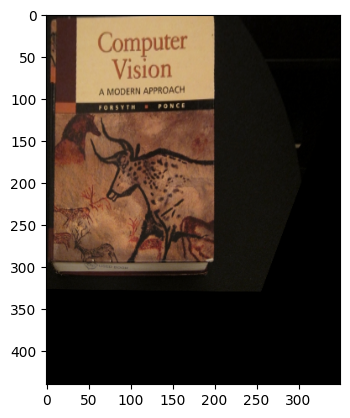

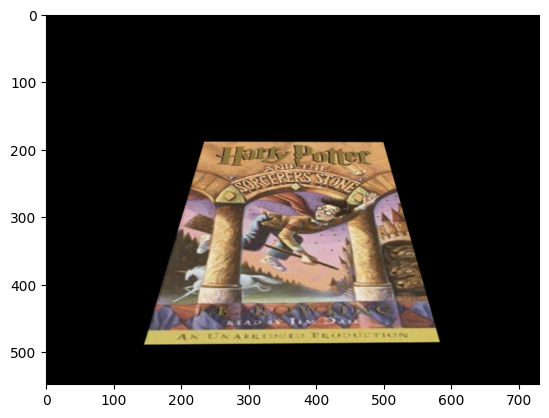

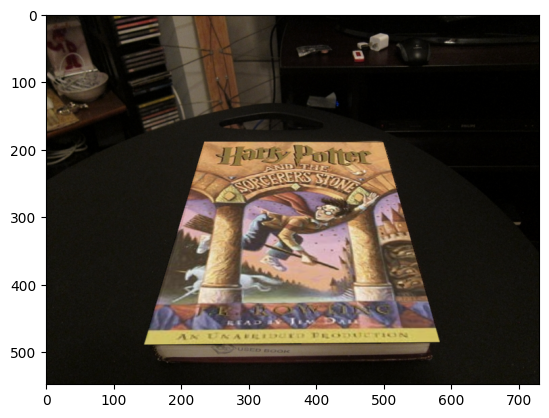

In [ ]:
# defaults are:
# ratio = 0.7
# sigma = 0.15
# max_iters = 600
# inlier_tol = 1.0

# (no need to change this but can if you want to experiment)
ratio = 0.7
sigma = 0.15
max_iters = 600
inlier_tol = 1.0

warpImage(ratio, sigma, max_iters, inlier_tol)

### Q2.2.5 (10 points):

Conduct ablation study with various max_iters and inlier_tol values. Plot the result images and explain the effect of these two parameters respectively.

max_iters =  500
inlier_tol =  0.25


<ipython-input-1-2390a488d248>:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


Highest Number of inliers:  4
Best H2to1:  [[-2.61737367e+00 -1.04716217e+00  8.91286976e+02]
 [-5.44945356e-01 -6.14142495e+00  1.50164716e+03]
 [-3.13729033e-03 -1.20712127e-02  1.00000000e+00]]


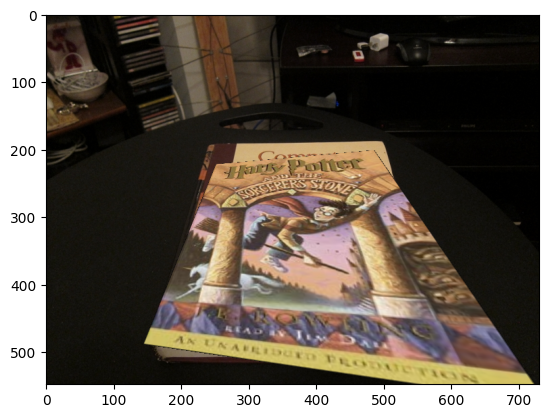

max_iters =  500
inlier_tol =  1.0
Highest Number of inliers:  9
Best H2to1:  [[ 3.35223019e+00  1.41792818e+00 -1.16857646e+03]
 [ 3.48392936e-01  7.68573365e+00 -1.73769781e+03]
 [ 1.33302190e-03  1.18250313e-02  1.00000000e+00]]


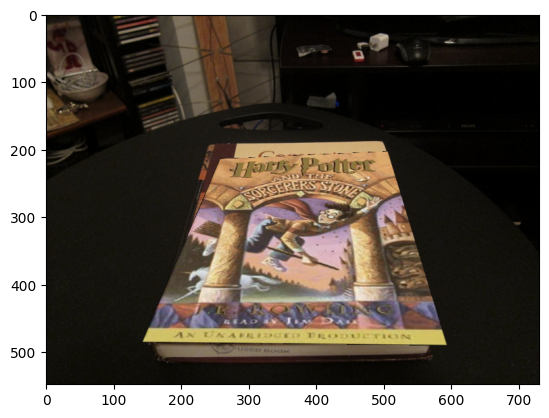

max_iters =  500
inlier_tol =  2.0
Highest Number of inliers:  13
Best H2to1:  [[ 1.58312192e+00  5.21734252e-01 -4.85528340e+02]
 [ 5.23760120e-02  3.50174910e+00 -7.06999816e+02]
 [ 1.72037674e-04  4.90964154e-03  1.00000000e+00]]


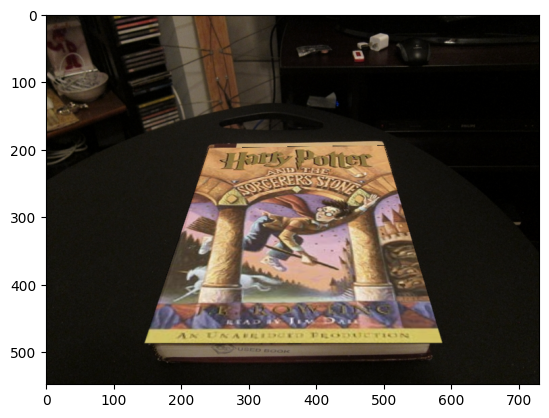

max_iters =  500
inlier_tol =  4.0
Highest Number of inliers:  17
Best H2to1:  [[ 1.33672075e+00  3.98842016e-01 -3.91868834e+02]
 [ 2.75581451e-02  2.87631534e+00 -5.55084432e+02]
 [ 7.69309247e-05  3.85881702e-03  1.00000000e+00]]


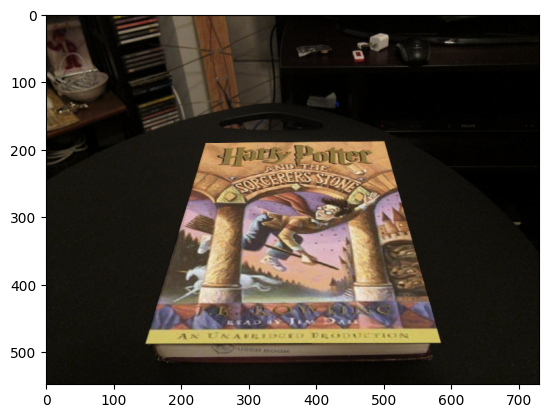

max_iters =  500
inlier_tol =  10.0
Highest Number of inliers:  18
Best H2to1:  [[ 1.55377839e+00  6.65407114e-01 -5.39415178e+02]
 [ 4.69061173e-02  3.38891484e+00 -6.73028463e+02]
 [ 1.46992815e-04  4.79122814e-03  1.00000000e+00]]


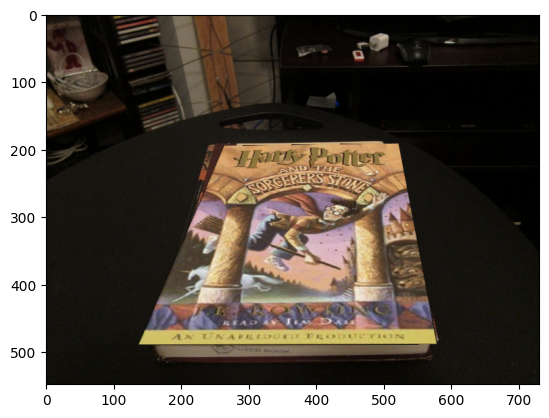

max_iters =  600
inlier_tol =  0.25
Highest Number of inliers:  4
Best H2to1:  [[-3.27366087e-02 -3.20037526e-01  1.44862271e+02]
 [-1.20192538e-01 -4.43549432e-01  2.35049179e+02]
 [-4.81500792e-04 -1.91622748e-03  1.00000000e+00]]


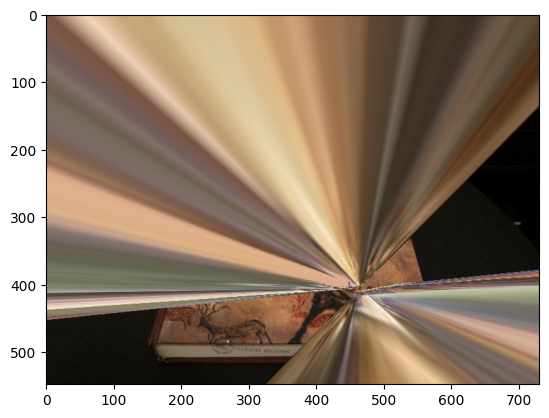

max_iters =  600
inlier_tol =  1.0
Highest Number of inliers:  7
Best H2to1:  [[ 1.47863060e+00  4.88236349e-01 -4.46863644e+02]
 [-4.99779290e-02  3.38042763e+00 -6.49170039e+02]
 [-2.75098167e-04  5.02363853e-03  1.00000000e+00]]


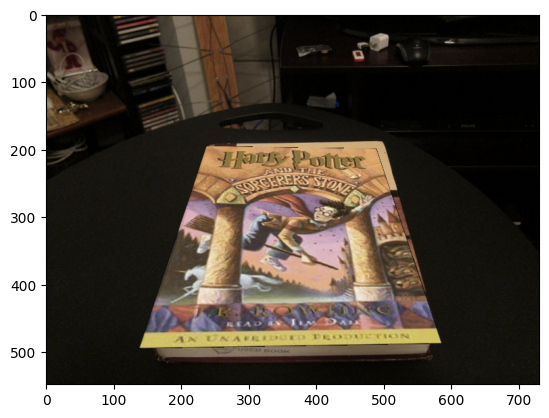

max_iters =  600
inlier_tol =  2.0
Highest Number of inliers:  16
Best H2to1:  [[ 1.33732085e+00  4.00517210e-01 -3.92604363e+02]
 [ 2.67553422e-02  2.88107030e+00 -5.56298213e+02]
 [ 7.47805128e-05  3.86528954e-03  1.00000000e+00]]


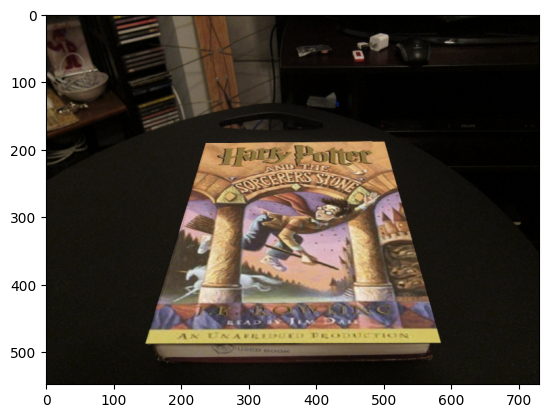

max_iters =  600
inlier_tol =  4.0
Highest Number of inliers:  12
Best H2to1:  [[ 1.89427973e+00  4.88368770e-02 -3.48301337e+02]
 [ 2.32197279e-01  3.99507463e+00 -8.54257382e+02]
 [ 8.89862783e-04  5.48538845e-03  1.00000000e+00]]


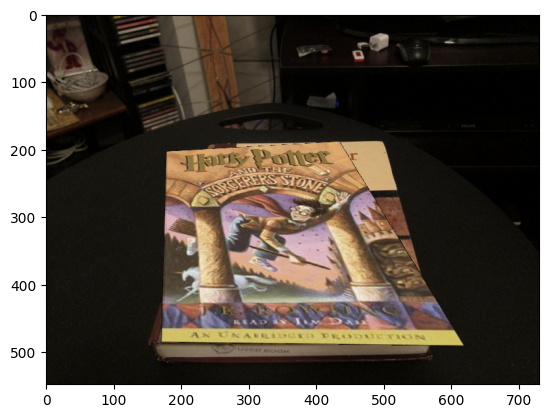

max_iters =  600
inlier_tol =  10.0
Highest Number of inliers:  18
Best H2to1:  [[ 1.55377839e+00  6.65407114e-01 -5.39415178e+02]
 [ 4.69061173e-02  3.38891484e+00 -6.73028463e+02]
 [ 1.46992815e-04  4.79122814e-03  1.00000000e+00]]


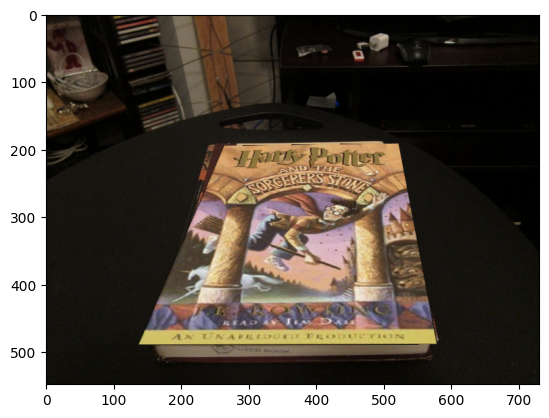

max_iters =  700
inlier_tol =  0.25
Highest Number of inliers:  4
Best H2to1:  [[-1.92177980e-01 -1.97859981e-01  1.46281667e+02]
 [-2.51498227e-01 -4.19878434e-01  2.48841595e+02]
 [-1.13422812e-03 -1.57420695e-03  1.00000000e+00]]


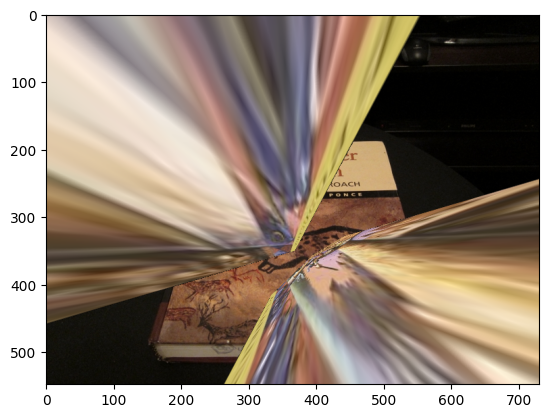

max_iters =  700
inlier_tol =  1.0
Highest Number of inliers:  13
Best H2to1:  [[ 1.24786540e+00  3.68156577e-01 -3.61799259e+02]
 [-4.86555926e-03  2.71294303e+00 -5.11587103e+02]
 [-6.37368515e-05  3.63044556e-03  1.00000000e+00]]


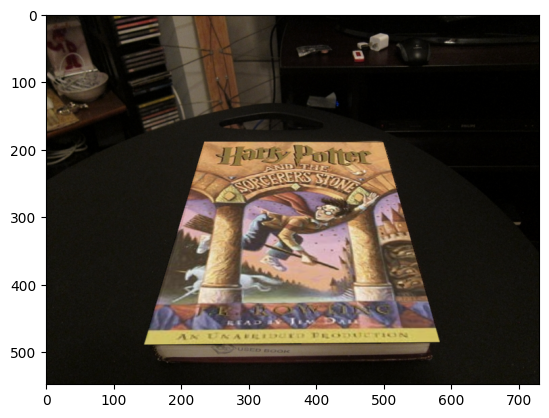

max_iters =  700
inlier_tol =  2.0
Highest Number of inliers:  12
Best H2to1:  [[ 1.57461262e+00  7.33903443e-01 -5.71847878e+02]
 [ 2.44774466e-02  3.44185280e+00 -6.74344125e+02]
 [ 6.39945119e-05  4.98599278e-03  1.00000000e+00]]


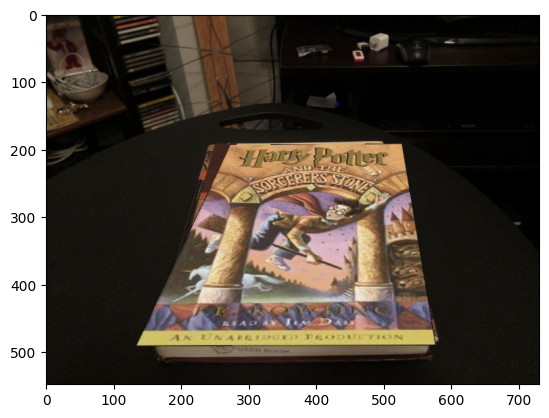

max_iters =  700
inlier_tol =  4.0
Highest Number of inliers:  16
Best H2to1:  [[ 1.35428795e+00  6.07703766e-01 -4.77545140e+02]
 [-5.27425393e-02  3.01675204e+00 -5.62570488e+02]
 [-2.53181142e-04  4.35775763e-03  1.00000000e+00]]


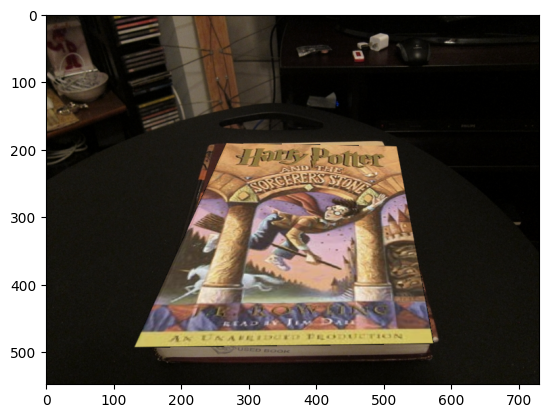

max_iters =  700
inlier_tol =  10.0
Highest Number of inliers:  19
Best H2to1:  [[ 1.60902022e+00  7.98896353e-01 -6.04012731e+02]
 [ 4.89699506e-02  3.48790431e+00 -6.89853797e+02]
 [ 1.54789135e-04  5.03007409e-03  1.00000000e+00]]


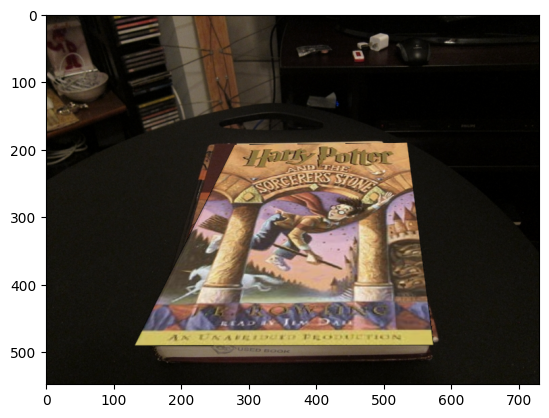

max_iters =  800
inlier_tol =  0.25
Highest Number of inliers:  4
Best H2to1:  [[ 5.36057932e-01  1.19295066e+00 -2.64415206e+02]
 [ 2.36794065e-01  3.46412399e+00 -7.64908778e+02]
 [-2.68481447e-04  5.53325534e-03  1.00000000e+00]]


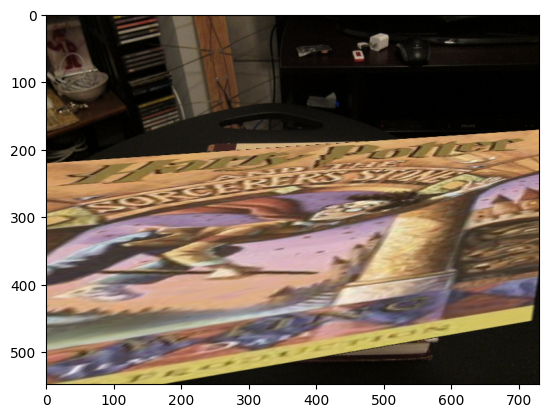

max_iters =  800
inlier_tol =  1.0
Highest Number of inliers:  9
Best H2to1:  [[ 8.35306591e-01  1.34210569e-01 -1.95987476e+02]
 [ 3.52888178e-04  1.58659069e+00 -2.49434784e+02]
 [-2.58545206e-05  1.60941485e-03  1.00000000e+00]]


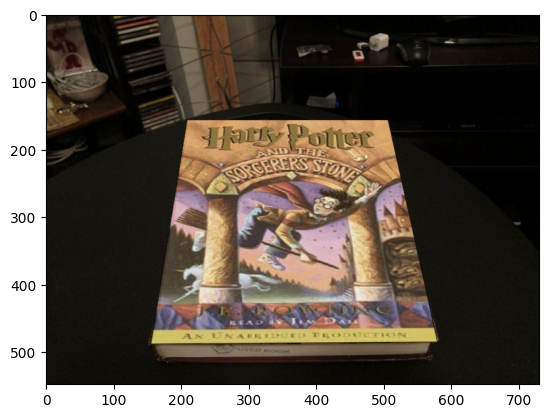

max_iters =  800
inlier_tol =  2.0
Highest Number of inliers:  17
Best H2to1:  [[ 1.33672075e+00  3.98842016e-01 -3.91868834e+02]
 [ 2.75581451e-02  2.87631534e+00 -5.55084432e+02]
 [ 7.69309247e-05  3.85881702e-03  1.00000000e+00]]


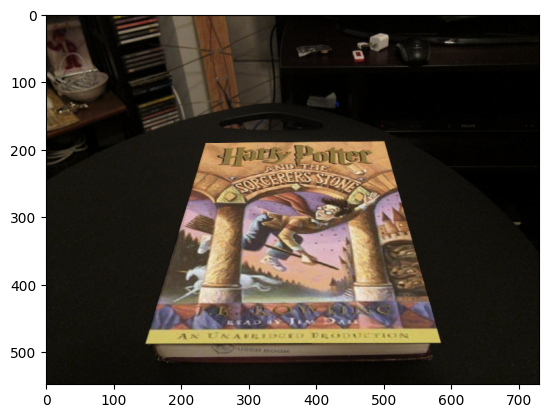

max_iters =  800
inlier_tol =  4.0
Highest Number of inliers:  16
Best H2to1:  [[ 1.33732085e+00  4.00517210e-01 -3.92604363e+02]
 [ 2.67553422e-02  2.88107030e+00 -5.56298213e+02]
 [ 7.47805128e-05  3.86528954e-03  1.00000000e+00]]


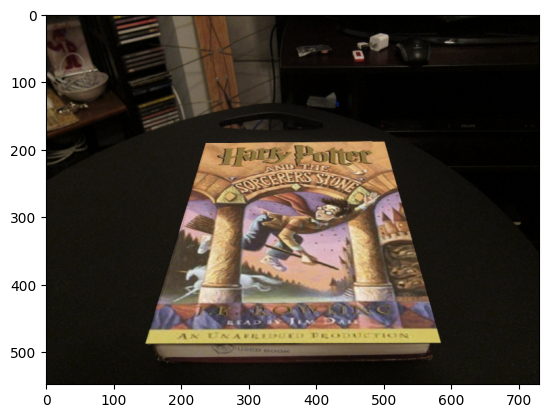

max_iters =  800
inlier_tol =  10.0
Highest Number of inliers:  19
Best H2to1:  [[ 1.60902022e+00  7.98896353e-01 -6.04012731e+02]
 [ 4.89699506e-02  3.48790431e+00 -6.89853797e+02]
 [ 1.54789135e-04  5.03007409e-03  1.00000000e+00]]


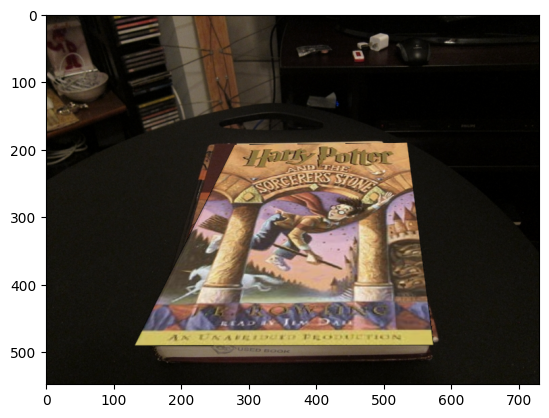

In [ ]:
# ===== your code here! =====
# Experiment with different max_iters and inlier_tol values.
# Include the result images in the write-up.
ratio = 0.7
sigma = 0.15
max_iters = [500, 600, 700, 800]
inlier_tol = [0.25, 1.0, 2.0, 4.0, 10.0]

for i in max_iters:
  for j in inlier_tol:
    print('max_iters = ', i)
    print('inlier_tol = ', j)
    warpImage(ratio, sigma, i, j)

# ==== end of code ====

---

Explain the effect of max_iters and inlier_tol:

1. Inlier_tol: The inlier tolerance defines the maximum euclidean distance to consider a point as an inlier. Based on the ablation study, there is a window between which the inlier_tol should be (0.5 to 4.0). If it is too low, even good points will not be considered an inlier. If it is too high, bad points will be considered an inlier. Both scenarios will lead to bad homography computation.
1. Max_Iterations: As iterations are increased, the combinations of 4 points chosen in RANSAC to compute homographies will increase. This will lead to an overall more thorough and repeatable RANSAC function. It also may compute a better homography than one with a lower number of iterations as it will cover a larger subset of all possible randomly sampled combinations.

---

# Q3 Create a Simple Panorama

## Q3.1 Create a panorama (10 points):

#### Implement the function createPanorama

In [ ]:
def createPanorama(left_im, right_im, ratio, sigma, max_iters, inlier_tol):
    """
    Create a panorama augmented reality application by computing a homography
    and stitching together a left and right image.

    Input
    -----
    left_im: left image
    right_im: right image
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    max_iters: the number of iterations to run RANSAC for
    inlier_tol: the tolerance value for considering a point to be an inlier

    Returns
    -------
    panorama_im: Stitched together panorama

    """

    # ===== your code here! =====
    # TODO: match features between images
    # This can be done using matchPics, cpselect, or any other function.
    matches, locs1, locs2 = matchPics(left_im, right_im, ratio, sigma)
    locs1_matched_idx = matches[:,0]
    locs2_matched_idx = matches[:,1]
    matched_locs1 = locs1[locs1_matched_idx]
    matched_locs2 = locs2[locs2_matched_idx]
    matched_locs1[:,[0,1]] = matched_locs1[:,[1,0]]
    matched_locs2[:,[0,1]] = matched_locs2[:,[1,0]]

    #displayMatched(left_im, right_im, ratio, sigma)

    # TODO: Get homography by RANSAC using computeH_ransac
    H2to1, _ = computeH_ransac(matched_locs1, matched_locs2, max_iters, inlier_tol)

    # TODO: Stich together the two images
    # Requires the use of cv2.warpPerspective
    panorama_im = cv2.warpPerspective(right_im, H2to1, (int(left_im.shape[1] + (right_im.shape[1]*0.4)), left_im.shape[0]))
    panorama_im[0:left_im.shape[0], 0:left_im.shape[1]] = left_im

    #panorama_im = compositeH_pano(H2to1, right_im, left_im)

    # ==== end of code ====

    return panorama_im.astype(np.uint8)

#### Visualize Panorama

Make sure to use **your own images** and **include them as well as the result** in the report.

<ipython-input-3-2390a488d248>:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


Highest Number of inliers:  21
Best H2to1:  [[ 6.97393062e-01 -3.65380514e-02  3.77920273e+02]
 [-9.07293396e-02  8.77257611e-01  3.49325288e+01]
 [-2.01787573e-04 -7.26707211e-06  1.00000000e+00]]


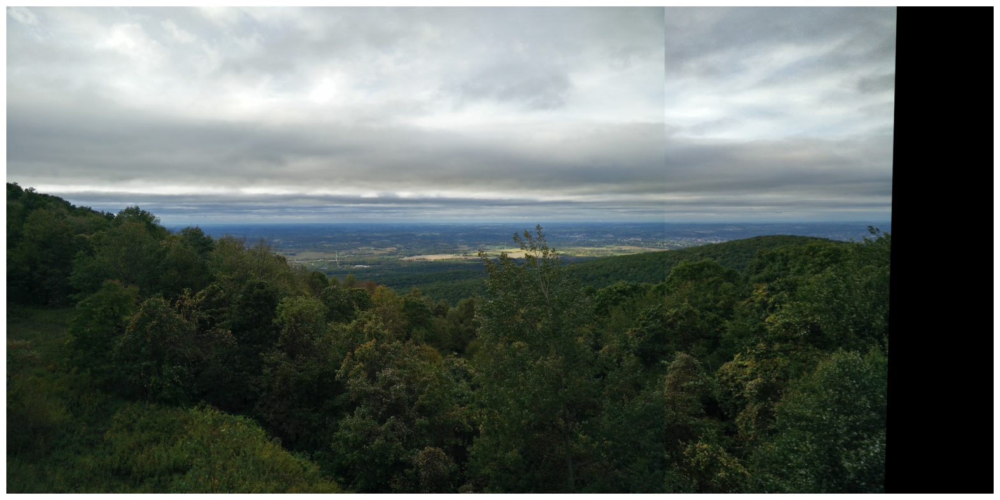

In [ ]:
left_im_path = os.path.join(DATA_DIR, 'pano_left.jpg')
left_im = skimage.io.imread(left_im_path)
right_im_path = os.path.join(DATA_DIR, 'pano_right.jpg')
right_im = skimage.io.imread(right_im_path)

# Feel free to adjust as needed
ratio = 0.7
sigma = 0.15
max_iters = 600
inlier_tol = 1

panorama_im = createPanorama(left_im, right_im, ratio, sigma, max_iters, inlier_tol)

plt.figure(figsize=(20,10))
plt.imshow(panorama_im)
plt.axis('off')
plt.show()

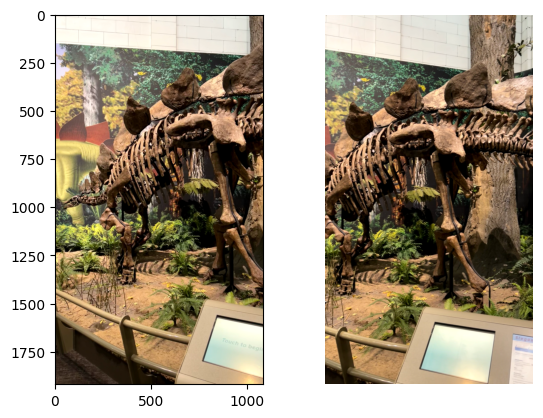

<ipython-input-3-2390a488d248>:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


Highest Number of inliers:  97
Best H2to1:  [[ 9.20121210e-01  1.94488097e-02  2.43469376e+02]
 [-1.01407887e-01  9.84750023e-01 -1.21459505e+01]
 [-9.38993968e-05  1.07292968e-05  1.00000000e+00]]


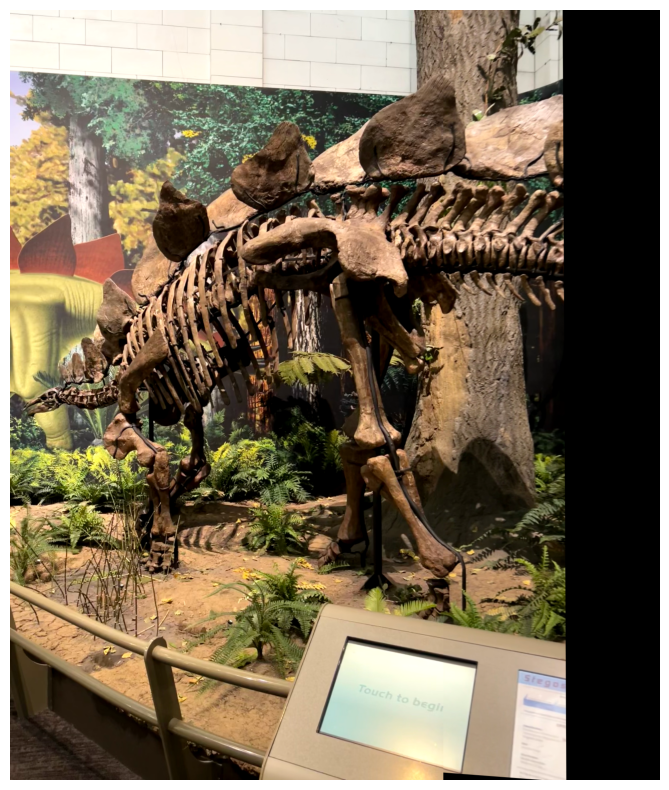

In [ ]:
left_im_path = os.path.join(DATA_DIR, 'utils_frame_1.png')
left_im = skimage.io.imread(left_im_path)
right_im_path = os.path.join(DATA_DIR, 'utils_frame_2.png')
right_im = skimage.io.imread(right_im_path)
left_im = left_im[:, :, :3]
right_im = right_im[:, :, :3]
f, x = plt.subplots(1,2)
x[0].imshow(left_im)
plt.axis("off")
x[1].imshow(right_im)
plt.axis("off")
plt.show()


# Feel free to adjust as needed
ratio = 0.6
sigma = 0.15
max_iters = 1200
inlier_tol = 1.5

panorama_im = createPanorama(left_im, right_im, ratio, sigma, max_iters, inlier_tol)

plt.figure(figsize=(20,10))
plt.imshow(panorama_im)
plt.axis('off')
plt.show()